# JP-Ensimag Trailstone Wind Power Forecasting 2023
# Rüzgar Enerjisi Tahmini

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns",100)
import plotly.express as px
from datetime import date

In [2]:
train=pd.read_csv("train.csv")
test=pd.read_csv("test.csv")

In [3]:
train.head()

,date,u10,v10,u100,v100,production
0,2020-01-01 01:00:00,2.124600,-2.681966,2.864280,-3.666076,0.000000
1,2020-01-01 02:00:00,2.521695,-1.796960,3.344859,-2.464761,0.054879
2,2020-01-01 03:00:00,2.672210,-0.822516,3.508448,-1.214093,0.110234
3,2020-01-01 04:00:00,2.457504,-0.143642,3.215233,-0.355546,0.165116
4,2020-01-01 05:00:00,2.245898,0.389576,2.957678,0.332701,0.156940


In [4]:
test.head()

,date,u10,v10,u100,v100
0,2021-01-01 00:00:00,3.103149,1.295629,4.146771,1.672058
1,2021-01-01 01:00:00,3.456026,1.799494,4.624995,2.329869
2,2021-01-01 02:00:00,3.716234,1.893639,4.987532,2.435546
3,2021-01-01 03:00:00,4.029650,2.195310,5.442522,2.855735
4,2021-01-01 04:00:00,4.200922,2.402018,5.703258,3.147100


In [5]:
print(train.shape)
print(test.shape)

(8783, 6)
(7982, 5)


1. **date (tarih):** Zamanın belirtildiği sütun. Her satır, belirli bir tarih ve saatteki verileri temsil eder.

2. **u10:** Rüzgar hızının 10 metreye kadar olan yükseklikteki bileşeni. Bu, rüzgarın yatay yöndeki hızını belirtir.

3. **v10:** Rüzgarın 10 metreye kadar olan yükseklikteki dikey bileşeni. Bu, rüzgarın yukarı-aşağı yöndeki hızını belirtir.

4. **u100:** Rüzgar hızının 100 metreye kadar olan yükseklikteki bileşeni. Yüksek bir noktadaki rüzgar hızını belirtir.

5. **v100:** Rüzgarın 100 metreye kadar olan yükseklikteki dikey bileşeni. Bu, yüksek bir noktadaki rüzgarın yukarı-aşağı yöndeki hızını belirtir.

6. **production (üretim):** Rüzgar enerjisi parkının belirli bir tarih ve saatteki enerji üretimini temsil eden sütun. Bu, tahmin etmeye çalıştığınız hedef değişken olabilir.

Bu tür bir veri seti, makine öğrenimi modelleri kullanılarak rüzgar enerjisi üretimini tahmin etmek için eğitilebilir. Verileri inceleyerek, rüzgar hızı ve diğer faktörlerin enerji üretimi üzerindeki etkisini anlamak ve uygun bir model olur.

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8783 entries, 0 to 8782
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        8783 non-null   object 
 1   u10         8783 non-null   float64
 2   v10         8783 non-null   float64
 3   u100        8783 non-null   float64
 4   v100        8783 non-null   float64
 5   production  8783 non-null   float64
dtypes: float64(5), object(1)
memory usage: 411.8+ KB


In [12]:
train["date"] = pd.to_datetime(train["date"], format="%Y-%m-%d")

In [19]:
train["date"].value_counts()

2020-01-01 01:00:00    1
2020-09-01 03:00:00    1
2020-08-31 21:00:00    1
2020-08-31 22:00:00    1
2020-08-31 23:00:00    1
                      ..
2020-05-01 18:00:00    1
2020-05-01 17:00:00    1
2020-05-01 16:00:00    1
2020-05-01 15:00:00    1
2020-12-31 23:00:00    1
Name: date, Length: 8783, dtype: int64

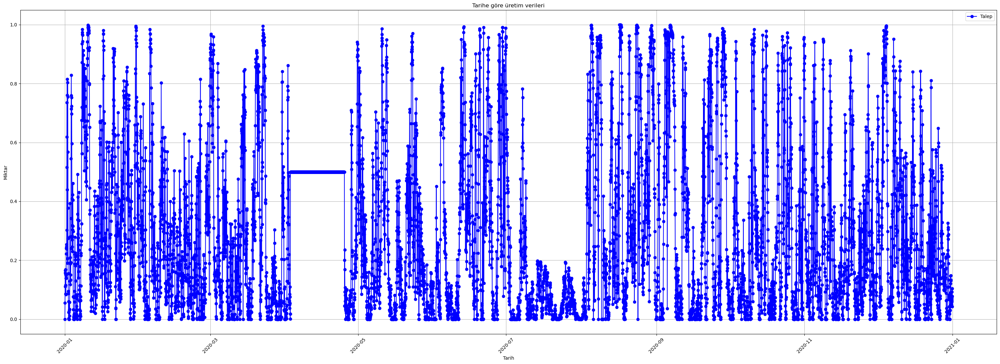

In [13]:
# Çizgi grafiği oluşturun
plt.figure(figsize=(30, 11))
plt.plot(train["date"], train["production"], marker='o', label='Talep', linestyle='-', color='b')

# Grafik başlığı ve etiketleri ayarlayın
plt.title('Tarihe göre üretim verileri')
plt.xlabel('Tarih')
plt.ylabel('Miktar')
plt.xticks(rotation=45)  # Tarih etiketlerini 45 derece döndür

# Eksenleri ayarlayın
plt.grid(True)
plt.legend()

# Grafiği göster
plt.tight_layout()
plt.show()

In [14]:
# üretim için:
fig_inventory = px.line(train, x='date',
                        y='production',
                        title='Tarihlere göre Üretim')
fig_inventory.show()

In [16]:
import plotly.graph_objects as go
# Üretim için aynı grafikte iki çizgi oluşturun
fig = px.line(train, x='date', title='Tarihlere Göre Üretim')
fig.add_trace(go.Scatter(x=train['date'], y=train['production'], mode='lines', name='Üretim'))

# Grafikleri göster
fig.show()

In [20]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

# Prophet için uygun sütun adlarını kullanarak veri çerçevesini yeniden adlandırın
forecast_data = train.rename(columns={"date": "ds", "production": "y"})

# Prophet modelini oluşturun ve eğitin
model = Prophet()
model.fit(forecast_data)

# Gelecekteki dönemleri oluşturun (örneğin, 365 gün sonrasını tahmin etmek için)
future = model.make_future_dataframe(periods=365)

# Tahminleri yapın
forecast = model.predict(future)

# Tahminleri çizdirin
fig = plot_plotly(model, forecast)
fig.show()

# Bileşenleri çizdirin (trend, haftalık, yıllık)
fig2 = plot_components_plotly(model, forecast)
fig2.show()

21:28:24 - cmdstanpy - INFO - Chain [1] start processing
21:28:26 - cmdstanpy - INFO - Chain [1] done processing


                               SARIMAX Results                                
Dep. Variable:             production   No. Observations:                 8783
Model:                 ARIMA(1, 0, 2)   Log Likelihood                8798.820
Date:                Sun, 10 Dec 2023   AIC                         -17587.640
Time:                        21:30:16   BIC                         -17552.237
Sample:                             0   HQIC                        -17575.579
                               - 8783                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2963      0.021     13.914      0.000       0.255       0.338
ar.L1          0.9410      0.005    186.816      0.000       0.931       0.951
ma.L1          0.1101      0.006     17.282      0.0

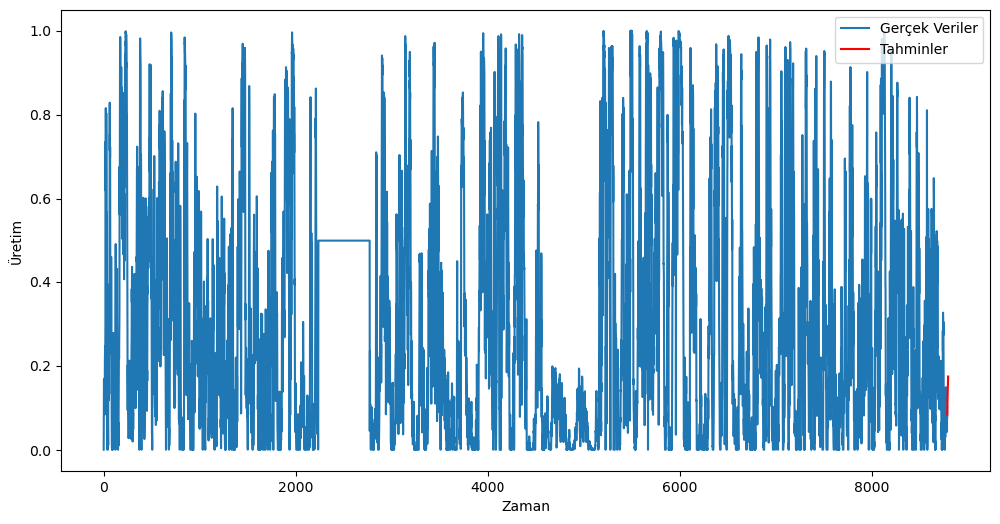

In [22]:
import statsmodels.api as sm

# ARIMA modeli için p, d, q değerlerini ayarlayın
p, d, q = 1, 0, 2

# ARIMA modelini oluşturun ve uyum sağlayın
model = sm.tsa.ARIMA(train["production"], order=(p, d, q))
fitted = model.fit()

# Model özetini görüntüle
print(fitted.summary())

# Tahminleri yapın
# Tahminleri yapın
forecast_steps = 10  # Gelecekteki kaç adım tahmin yapmak istediğinizi ayarlayın
forecast = fitted.forecast(steps=forecast_steps)

# Tahminleri ve gerçek verileri görselleştirin
plt.figure(figsize=(12, 6))
plt.plot(train["production"], label="Gerçek Veriler")
plt.plot(range(len(train), len(train) + forecast_steps), forecast, label="Tahminler", color='red')
plt.xlabel("Zaman")
plt.ylabel("Üretim")
plt.legend()
plt.show()

In [23]:
# Tahmin:
predictions = fitted.predict(len(train), len(train)+100)
print(predictions)

8783    0.083561
8784    0.097621
8785    0.109342
8786    0.120371
8787    0.130750
          ...   
8879    0.295649
8880    0.295685
8881    0.295719
8882    0.295751
8883    0.295782
Name: predicted_mean, Length: 101, dtype: float64


In [24]:
# Öncelikle DataFrame'inizin son tarihini bulun
last_date = train['date'].max()

# Kaç gün ileri tahmin yapmak istediğinizi belirtin
forecast_steps = 100

# Gelecekteki tarihleri oluşturun
future_dates = [last_date + pd.DateOffset(days=i) for i in range(1, forecast_steps + 1)]

# Talep ve envanter tahminlerinizi yapın (bu kodu uygun şekilde güncelleyin)
def forecast_production(date):
    # Burada gerçek bir tahmin fonksiyonu veya modeli kullanmalısınız
    # Örneğin, basit bir rastgele tahmin yapalım:
    return np.random.randint(100, 200)

# Gelecekteki tahminleri yapın
forecasted_production = [forecast_production(date) for date in future_dates]

# Gelecekteki tahminleri bir DataFrame'e dönüştürün
forecast_train = pd.DataFrame({
    'Date': future_dates,
    'Forecasted_production': forecasted_production,
})

# Sonuçları yazdırın veya başka bir işlem yapın
print(forecast_train)

                  Date  Forecasted_production
0  2021-01-01 23:00:00                    104
1  2021-01-02 23:00:00                    187
2  2021-01-03 23:00:00                    192
3  2021-01-04 23:00:00                    123
4  2021-01-05 23:00:00                    144
..                 ...                    ...
95 2021-04-06 23:00:00                    132
96 2021-04-07 23:00:00                    152
97 2021-04-08 23:00:00                    176
98 2021-04-09 23:00:00                    175
99 2021-04-10 23:00:00                    158

[100 rows x 2 columns]


In [29]:
test.head()

,date,u10,v10,u100,v100
0,2021-01-01 00:00:00,3.103149,1.295629,4.146771,1.672058
1,2021-01-01 01:00:00,3.456026,1.799494,4.624995,2.329869
2,2021-01-01 02:00:00,3.716234,1.893639,4.987532,2.435546
3,2021-01-01 03:00:00,4.029650,2.195310,5.442522,2.855735
4,2021-01-01 04:00:00,4.200922,2.402018,5.703258,3.147100


In [28]:
test.tail()

,date,u10,v10,u100,v100
7977,2021-11-29 20:00:00,-2.014530,1.793392,-4.502124,3.949871
7978,2021-11-29 21:00:00,-3.366064,2.831022,-4.991581,4.218858
7979,2021-11-29 22:00:00,-3.433361,2.457599,-4.796116,3.407203
7980,2021-11-29 23:00:00,-3.224261,2.049055,-4.407834,2.755195
7981,2021-11-30 00:00:00,-2.869353,1.685961,-3.871232,2.200453


In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Örnek veri oluşturalım
data = {
    'date': pd.date_range(start='2020-01-01', periods=500, freq='H'),
    'production': np.random.rand(500) * 100
}

# Veriyi DataFrame'e çevirelim
train = pd.DataFrame(data)
train.set_index('date', inplace=True)

# 'test' verisini oluşturalım
test_start_date = train.index.max() + pd.Timedelta(hours=1)
test_end_date = test_start_date + pd.Timedelta(days=7)
test = pd.DataFrame({'date': pd.date_range(test_start_date, test_end_date, freq='H')})
test.set_index('date', inplace=True)

# 'test' verisine 'production' sütunu ekleyin ve tahminle doldurun
test['production'] = np.nan  # 'production' sütununu ilk başta NaN (Not a Number) değerleriyle doldurun

# Öncelikle DataFrame'inizin son tarihini bulun
last_date = train.index.max()

# Kaç gün ileri tahmin yapmak istediğinizi belirtin
forecast_steps = 168  # 7 gün * 24 saat

# Gelecekteki tarihleri oluşturun
future_dates = pd.date_range(start=last_date + pd.Timedelta(hours=1), periods=forecast_steps, freq='H')

# Talep ve envanter tahminlerinizi yapın ve 'test' verisine doldurun
for date in future_dates:
    test.loc[date, 'production'] = forecast_production(date)

# Sonuçları yazdırın veya başka bir işlem yapın
print(test)

                     production
date                           
2020-01-21 20:00:00   88.122229
2020-01-21 21:00:00   64.144601
2020-01-21 22:00:00   28.410686
2020-01-21 23:00:00    4.131647
2020-01-22 00:00:00   82.601312
...                         ...
2020-01-28 16:00:00   46.216716
2020-01-28 17:00:00   79.873539
2020-01-28 18:00:00    8.817035
2020-01-28 19:00:00   69.269950
2020-01-28 20:00:00         NaN

[169 rows x 1 columns]


In [47]:
test.to_csv('submission.csv', index=False)